# Coursework 2025 - Consumption Saving

## Part I : Approximations

### Interpolation

Consider the function $f(x)=\frac{sin(|x|)}{|x|+0.0001}$ defined on
$[a,b]$ with $a=-2$ and $b=2$.

Consider the grid points $x_i=a+\frac{i}{N-1}(b-a)$ for $i\in[0,N]$.

**1.  Define in julia `a`, `b`, `N` and the function `f` . Compute the
    vector of grid points `s` (a vector of size `N`) then the values `y`
    (a vector of size `N`)that `f` takes at these grid points.**

In [ ]:
# Defining parameters
N = 100
a = -2
b = 2

# grid points
s = zeros(N)
for i in 1:N
    s[i] = a + (i-1)/(N-1) * (b-a)
end
s

100-element Vector{Float64}:
 -2.0
 -1.9595959595959596
 -1.9191919191919191
 -1.878787878787879
 -1.8383838383838385
 -1.797979797979798
 -1.7575757575757576
 -1.7171717171717171
 -1.6767676767676767
 -1.6363636363636362
  ⋮
  1.676767676767677
  1.7171717171717171
  1.7575757575757578
  1.797979797979798
  1.8383838383838382
  1.878787878787879
  1.9191919191919191
  1.9595959595959598
  2.0

In [ ]:
function f(x)
    sin(abs(x)) / (abs(x)+0.0001)
end

f (generic function with 1 method)

In [554]:
y = f.(s)

100-element Vector{Float64}:
 0.4546259821137351
 0.4721981257232264
 0.48972313280299073
 0.5071853162988267
 0.5245689722619838
 0.5418583972472488
 0.5590379057528692
 0.5760918476801626
 0.5930046257904755
 0.6097607131369709
 ⋮
 0.5930046257904754
 0.5760918476801626
 0.559037905752869
 0.5418583972472488
 0.524568972261984
 0.5071853162988267
 0.48972313280299073
 0.47219812572322634
 0.4546259821137351

**2.  Define a function `interp(s,y,x)` which approximates the original
    function `f` at any $x\in[-2,2]$ but is defined using only `s` and
    `y` (or if you prefer `a`,`b`, `N` and `y`). (hint: you can use the
    library `Interpolations.jl`)**

In [555]:
using Interpolations

In [ ]:
# creating function interp, adding option for linear extrapolation 
function interp(s, y, x)
    interp_linear = linear_interpolation(s, y, extrapolation_bc=Line())
    return interp_linear(x)
end

interp (generic function with 1 method)

**3.  On the same plot, represent `(s,y)` as a scatter plot, the function
    `f` and the interpolated values using `interp`. For the $x$-axis
    choose $[a-0.1, b+0.1]$. How does interp behave outside of $[a,b]$
    (i.e. when it extrtapolates). Can you find a way to make it
    exptrapolate linearly?**

In [557]:
using Plots

In [ ]:
# generating true f(), by passing very fine grid
xf = range(a-0.1, b+0.1; length=100000)
fvals = f.(xf)

100000-element Vector{Float64}:
 0.4110325063801122
 0.41105082326705983
 0.41106914016156226
 0.41108745706360167
 0.41110577397316095
 0.4111240908902228
 0.41114240781476974
 0.4111607247467844
 0.4111790416862496
 0.41119735863314794
 ⋮
 0.4111790416862496
 0.4111607247467844
 0.41114240781476974
 0.4111240908902228
 0.41110577397316095
 0.41108745706360167
 0.41106914016156226
 0.41105082326705983
 0.4110325063801122

In [559]:
# interpolation
ivals = [interp(s, y, x) for x in xf]

100000-element Vector{Float64}:
 0.4111349266802442
 0.4111531931061905
 0.41117145953213696
 0.41118972595808323
 0.41120799238402955
 0.4112262588099759
 0.41124452523592214
 0.4112627916618684
 0.41128105808781473
 0.4112993245137612
 ⋮
 0.41128105808781473
 0.4112627916618684
 0.41124452523592214
 0.4112262588099759
 0.41120799238402955
 0.41118972595808323
 0.41117145953213696
 0.4111531931061905
 0.4111349266802442

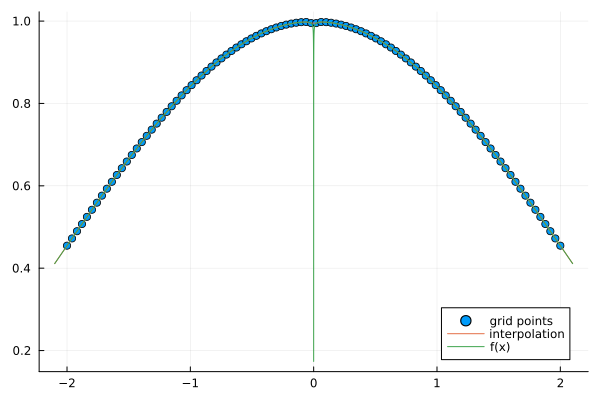

In [560]:
scatter(s, y, label="grid points")
plot!(xf, ivals, label="interpolation")
plot!(xf, fvals, label="f(x)")

# extrapolation performs well for x values close to a and b
# it does not perform well at 0

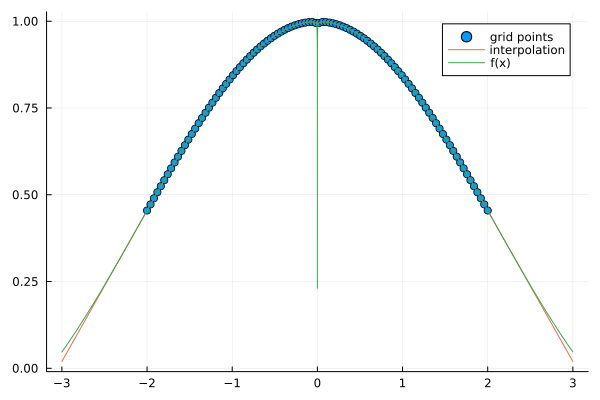

In [561]:
# true f
xf = range(a-1, b+1; length=100000)
fvals = f.(xf)

# interpolation
ivals = [interp(s, y, x) for x in xf]

scatter(s, y, label="grid points")
plot!(xf, ivals, label="interpolation")
plot!(xf, fvals, label="f(x)")

# extrapolation performs poorly for x values far outside a and b

### Discretizing a shock

Consider a random shock $\epsilon$ that follows a normal law with
standard deviation $\sigma$.

The goal here is just to compute numerically the integral

$$\mathbb{E} \left[ f(\epsilon) \right] $$

**4.  Define a variable $\sigma$. Choose a function `f` so that you can
    compute the above integral in closed form.**


In [562]:
σ = 1

# define simple function f, whose integral has a closed form: e^2
# E[f(e)] = E[e^2] = Var(e) = σ^2 = 1
function intf(ϵ)
    return ϵ^2
end

intf (generic function with 1 method)

#### Monte-Carlo

Take an integer $K>0$.

**5.  Try to evaluate the integral above by running $K$ random draws
    i.e. by using the formula
    $f^{MC, K} = \frac{1}{K}\sum_{i=1}^K f(\epsilon_i)$ where
    $\epsilon_i$ is a random draw. Ths is the Monte-Carlo approach.**

In [563]:
using Distributions, Statistics, Random

In [ ]:
# number of draws for monte carlo
K = 10000

10000

In [ ]:
# computing the expectation via monte carlo
function mc(f, σ, K)
    avg = 0

    for i in 1:K
        ϵ = rand(Normal(0, σ))
        avg += f(ϵ)
    end
    avg = avg/K

    return avg
end

mc (generic function with 1 method)

In [566]:
mc(intf, σ, K)

0.985714693557727

**6.  Evaluate the standard deviation in $f^{MC, K}$ by evaluating this
    function repeatedly. How does the standard deviation depend on $K$ ?**

In [ ]:
# computes many times the expectation via monte carlo, then take std of expectations
function mc_std(f, σ, K)

    mcvec = zeros(1000)

    for i in 1:length(mcvec)
        mcvec[i] = mc(f, σ, K)
    end

    return std(mcvec)
end

mc_std (generic function with 1 method)

In [568]:
Kvec = 100:1000:10000

stdmc = zeros(length(Kvec))
for (j, k) in enumerate(Kvec)
    stdmc[j] = mc_std(intf, σ, k)
end

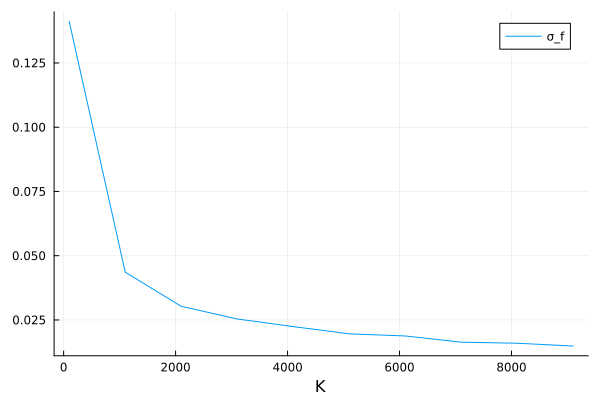

In [ ]:
# The std diminishes as the number of draws increases
plot(Kvec, stdmc, label="σ_f", xlabel="K")

#### Gauss-Hermite

Discretizing the shock consists in finding real numbers $(e_1, ... e_K)$
and positive real numbers $(w_1, ... w_K)$ such that for a “suitable”
function $f(\epsilon)$ we can write:

$$\mathbb{E} \left[ f(\epsilon) \right] \approx \sum_{i=1}^K w_i f(e_i)$$

The Gauss-Hermite quadrature is such a discretization scheme. It is
widely documented and there are good Julia libraries for it.

**7.  Approximate the expectation above using Gauss-Hermite nodes and
    weights. What is the error? How does it depend on $K$ for the
    function you have chosen?**

In [570]:
using FastGaussQuadrature

In [ ]:
# creating function to perform gauss hermite integration
function gh(f, K, μ, σ)
    avg = 0
    x, w = gausshermite(K; normalize=true)  # nodes, weights, this is for normalised shocks

    for i in 1:K
        avg += f(μ + σ*x[i]) * w[i]  # here we adjust for the mean and std of the shock : N(1, 1)     
    end
    return avg
end

gh (generic function with 1 method)

In [ ]:
gh(intf, K, 0, 1) # similar to MC method

0.9999999999999392

In [573]:
function gh_std(f, K, μ, σ)

    mcvec = zeros(1000)

    for i in 1:length(mcvec)
        mcvec[i] = gh(f, K, μ, σ)
    end

    return std(mcvec)
end

gh_std (generic function with 1 method)

In [574]:
gh_std(intf, 10, 0, σ)

4.443114211273408e-16

In [575]:
Kvec = 1:1:10

err = zeros(length(Kvec))
for (j, k) in enumerate(Kvec)
    err[j] = abs(1-gh(intf, k, 0, σ))
end

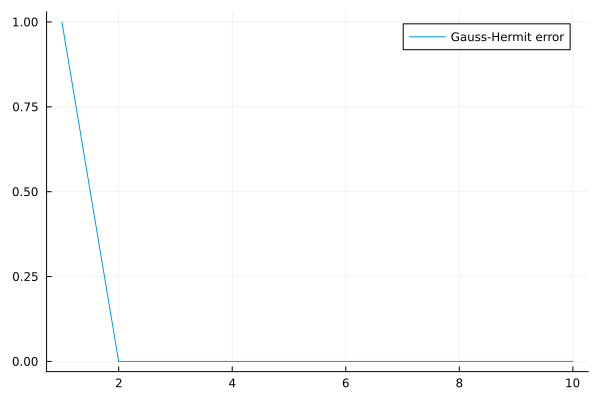

In [ ]:
plot(Kvec, err, label="Gauss-Hermit error")
# the std reaches zero very fast, this method is not based on draws

## Part II : The Ayiagari Model

In this exercise, we try to solve the Ayiagari model.

The Ayiagari model features a continuum of households indexed by
$i\in[0,1]$, who take wage rate $\color{red} w$ and interest rate
$\color{red} r$ as given.

Each households $i$ is hit by a random productivity shock
($\color{green}e^i_t$), normally distributed, with variance $\sigma$ and
mean $1$ so that, at the aggregate, the average productivity is $1$.

Each household supplies $\color{green}e^i_t$ units of work, and can
decide to consume $c^i_t$ or save her available income $a^i_{t}$.

Available income $a^i_t$ thus follows the law of motion:

$$a^i_{t+1} = {\color{red}w } {\color{green}e^i_{t+1}} +  (a^i_{t} - c^i_{t}) {\color{red}r}$$

There is no borrowing so that $0<c^i_t\leq a^i_{t}$. The household
choooses consumption optimally in order to maximize:

$$\mathbb{E}_0 \sum_t \beta^t U(c^i_t)$$

with $U(x)=\frac{x^{1-\gamma}}{1-\gamma}$ and $\beta=0.96$,
$\gamma=4.0$.

Aggregate savings are turned into productive capital:

$$K = \int_i a^i_t $$

Note that in equilibrium the distribution of savings is invariant, hence
the absence of a time-subscript for aggregate capital.

Also, the ergodicity property implies that the invariant distribution
across all agents is identical to the distribution of asset levels
reached across time by any single agent $i$ so that we also have:

$$K = \mathbb{E} [ a^i_t ]$$

Capital is rented by competitive firms that all produce with the same
Cobb-Douglas technology. Total production is:

$$Y = K^{\alpha} L^{1-\alpha}$$

with $L=\overline{L}=1$ and $\alpha=0.3$.

Wage rate and interest rate are then determined by marginal conditions:

$${\color{red}r}=\alpha \frac{Y}{K}$$
$${\color{red}w}=(1-\alpha) \frac{Y}{L}$$

From the structure of the whole model, it is clear that capital
$\overline{K}$ determines the whole equilibrium.

> **Note**
>
> Because there is no depreciation, the rental rate determined by the
> marginal conditions, equals the returns on savings when they are
> turned into productive capital.


### Aggregate production

**8.  Create a namedtuple (or a structure) `m` to hold all the model
    informations.**

In [ ]:
# tuple to host model parameters
m = (; 
    β = 0.96, 
    γ = 4.0, 
    α = 0.3,
    Lbar = 1,
    σ = 0.2
)

(β = 0.96, γ = 4.0, α = 0.3, Lbar = 1, σ = 0.2)

**9.  Create a function `rates(K,m)::Tuple{Float64,Float64}` that takes
    aggregate capital and return the rental rate of capital and the wage
    rate.**


In [ ]:
# computes prices: wages and interest rates for capital (optimal wrt firm problem)
function rates(K,m)
    (; β, γ, α, Lbar, σ) = m
    Y = (K^α) * (Lbar^(1-α))
    r = α * Y / K
    w = (1 - α) * Y / Lbar
    return (; r, w)
end

rates (generic function with 1 method)

In [579]:
r, w = rates(5,m)

(r = 0.09723939580156574, w = 1.1344596176849335)

**10.  Choose an initial level of capital $K_0$ and corresponding rates
    $p_0=(r_0,w_0)$ so that $\beta < \beta r_0 < 1$. Define the
    corresponding varaibles `K_0` and `p_0`.**

> **Note**
>
> The second part of this inequality ensures that wealth distribution is
> well defined – agents don’t want to accumulate assets until they have
> unbounded wealth.

In [580]:
K_0 = 0.17
p_0 = rates(K_0, m)

(r = 1.0370674650372804, w = 0.4113700944647879)

In [ ]:
(0.96 < 0.96*p_0[1]) && (0.96*p_0[1] < 1) # level of K such that the wealth distribution is well defined

true

### Consumption-Savings Problem

We now solve the individual problem given the vector of rates `p`. This
can be done using any solution method (any version of time-iteration for
instance). Here we choose to use the classic value-function iteration
instead.

Given the formulation of the household problem, we can look for a
decision rule for consumption $c(a)$ with $c(a)\in]0,a]$. To implement
value function iteration, we will also define $V(a)$.

> **Note**
>
> Since all agents are identical ex ante, we need to solve only one
> optimization problem. Hence we drop the $i$ subscripts.

In theory, the state-space is $]0,\infty]$ but in practice we
approximate the system on $]0,\overline{A}]$ and adjust $\overline{A}$
until the solution is well defined.

> **Note**
>
> If $\color{green}e^i_t$ has a compact support, theoretical
> considerations show that one can choose such an $\overline{A}$.

**11.  Write the Bellman equation**

$V(a) = max_{c(a) \in (0,a]} \{U(c(a)) + \beta E[V(a')]  \}$

s.t.

$a' = we' + r(a-c(a))$

with 

$e \sim N(1,\sigma^2)$

Which we can rewrite as:

$V(a) = max_{c(a) \in (0,a]} \{U(c(a)) + \beta E[V(we' + r(a-c(a)))] \}$


#### Approximate space

To represent functions ($c()$ and $V()$) using a finite number of
parameters, we discretize the state-space into a finite grid `g`, made
of $N$ linearly spaced points between $\epsilon>0$ and $\overline{A}$
(the role of $\epsilon>0$ is to avoid undefined behaviour for $c=0$).

We use gauss-hermite nodes and weights weights to approximate the shock
$\epsilon$.

**12.  Create a namedtuple `dis` to represent the discretized model
    (i.e. the grid and the quadrature).**


In [582]:
function discretise(N, eps, Abar, K)

    g = range(eps, Abar, length=N)

    # kth order rule is exact when f is a k-1 order polynomial: f(ϵ) = V(ϵ) concave is order 2 -> choose order = 3 
    nodes, weights = gausshermite(K; normalize=true)  # nodes, weights

    return (; g, nodes, weights)
end

discretise (generic function with 1 method)

In [583]:
N = 100
eps = 1e-2
Abar = 100
order = 5

dis = discretise(N, eps, Abar, order)

(g = 0.01:1.01:100.0, nodes = [-2.8569700138728056, -1.3556261799742675, -1.2560739669470201e-15, 1.3556261799742675, 2.8569700138728056], weights = [0.011257411327720667, 0.22207592200561244, 0.5333333333333339, 0.22207592200561244, 0.011257411327720667])

#### Value Function Iteration

**13.  Take an initial guess `vvec` (preferably concave) for the values on
    the grid and define the function
    `value_update(a, c, vvec, m, p, dis)::Float64` which compute the
    expression inside the `max` in the Bellman equation for any state
    `a`, any acceptable consumption level `c` and a continuation value,
    obtained by interpolating the values `vvec` at any point outside the
    grid.**

In [584]:
function u(c,m)
    (; γ) = m
    return c^(1-γ) / (1-γ)
end

u (generic function with 1 method)

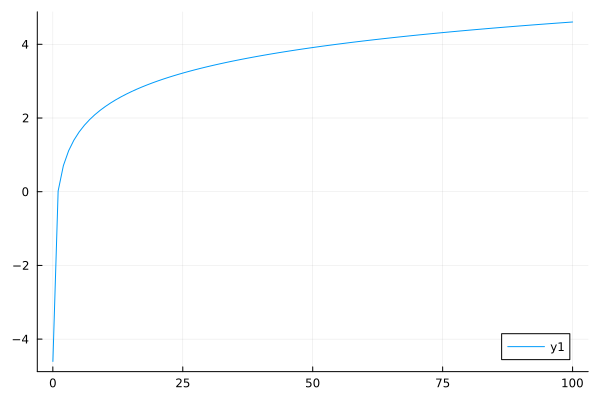

In [ ]:
# concave guess for the value function 
vvec = log.(dis.g)

# a_vals = [a for a in dis.g]
# vvec = [u(a, m) for a in dis.g]
plot(dis.g, vvec)

In [ ]:
# updates the value function
function value_update(a, c, vvec, m, p, dis)

    (; β, γ, α, Lbar, σ) = m
    (; r, w) = p
    (; g, nodes, weights) = dis

    Evvec = 0
    for i in 1:length(nodes)

        aprime = w * (1+nodes[i]*σ) + r*(a - c)
        vprime = interp(g, vvec, aprime)
        Evvec += weights[i] * vprime # takes expectation of the value function next period across nodes

    end
    
    return u(c, m) + β * Evvec
end

value_update (generic function with 1 method)


**14.  Use your preferred method for constrained optimization to compute
    the value $c\in]0,a]$ which maximizes the function `value_update`
    for a given `a` of your choice.**

> **Note**
>
> This is the crucial step. You can test whether it works for different
> values of `a` and debug what’s going by making a plot.

In [587]:
using Optim

In [ ]:
# find optimal consumption level based on asset (state var), and value function
function opt_c(a, vvec, m, p, dis; eps=1e-3)
    
    objective(c) = -value_update(a, c, vvec, m, p, dis) # Optim minimises -> take minus
    result = optimize(objective, eps, a) # c constrained between eps and a                     
    
    cstar = Optim.minimizer(result)
    vstar = -Optim.minimum(result)
                    
    return cstar, vstar
end

opt_c (generic function with 1 method)

In [ ]:
# tesing that the maximisation works properly
vvec = log.(dis.g)
a = 1

cvec = range(eps, a, length=N)

vprime = zeros(N)
for i in 1:N
    vprime[i] = value_update(a, cvec[i], vvec, m, p_0, dis)
end

In [ ]:
cstar, vstar = opt_c(a, vvec, m, p_0, dis) # vstar should be greater that just taking the max value on the grid
# because opt_c interpolates

(0.6843582171686569, -2.25752365775175)

In [ ]:
vstar > maximum(vprime) #  indeed vstar greater

true

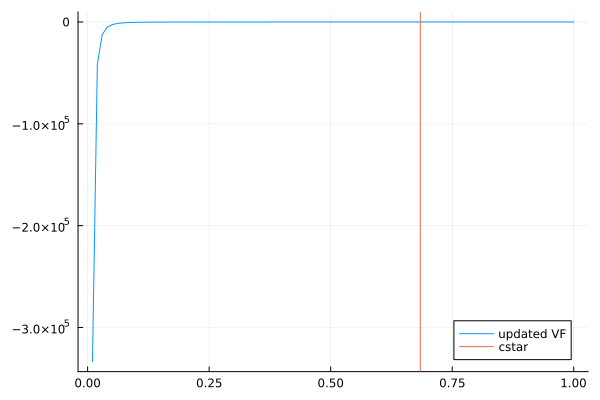

In [592]:
plot(cvec, vprime, label="updated VF")
vline!([cstar], label="cstar")

**15.  Write a function
    `bellman_step(vvec, m, p, dis)::Tuple{Vector, Vector}` which takes
    in a vector representing the value function tomorrow and returns a
    new value vector and policy vector resulting from the maximization.**

In [593]:
function bellman_step(vvec, m, p, dis)
    
    (; g) = dis
    
    N = length(g)
    vprime = zeros(N)
    policy = zeros(N)
    
    for (i, a) in enumerate(g)

        policy[i], vprime[i] = opt_c(a, vvec, m, p, dis)
        
    end
    
    return (; vprime, policy)
end

bellman_step (generic function with 1 method)

**16.  Write a `vfi(m, p, dis)` function, which solves the consumption
    savings problem by value function iteration. It should return the
    vector of values and the consumption vector.**

In [594]:
function vfi(m, p, dis; τ_η=1e-6, max_iter=1000, verbose=false)
    (; g) = dis
    
    vprime = zeros(N)
    policy = zeros(N)
    vvec = log.(dis.g)
        
    for iter=1:max_iter
        vprime, policy = bellman_step(vvec, m, p, dis)
        
        η = maximum(abs.(vprime - vvec))
        
        vvec = vprime

        if η < τ_η
            break
        end

        if verbose
            @show (iter, η)
        end
    end
    
    return vprime, policy
end


vfi (generic function with 1 method)

**17.  Check that the solution makes sense: plot the solution, the
    boundaries, check the extrapolation behaviour…**

In [595]:
v, pol = @time vfi(m, p_0, dis)

  0.774390 seconds (7.92 M allocations: 3.351 GiB, 20.70% gc time, 13.86% compilation time)


([-791033.7036116268, -229.55390717550637, -101.14749062576306, -71.97651829349309, -55.92990736691103, -45.1487315251132, -37.263552196908535, -31.214991485543315, -26.443493719100818, -22.609415551403863  …  -0.1713489920445113, -0.16635406661661506, -0.16155143288018967, -0.1569319245984498, -0.15248689496659504, -0.14820818258890894, -0.144088080049485, -0.14011931225051902, -0.13629500768859137, -0.13260708196152216], [0.009999999742754074, 0.20647114072914782, 0.37314839978755515, 0.4800113425514515, 0.539109575431805, 0.577524117225261, 0.6136241222898475, 0.6497241207566966, 0.6870556868461298, 0.7251919620794695  …  3.746391228624123, 3.7836262248096273, 3.8208609048840514, 3.8580953446575252, 3.89532936868576, 3.932563222520699, 3.9697971787364374, 4.006270816171464, 4.042370822236618, 4.072538847428123])

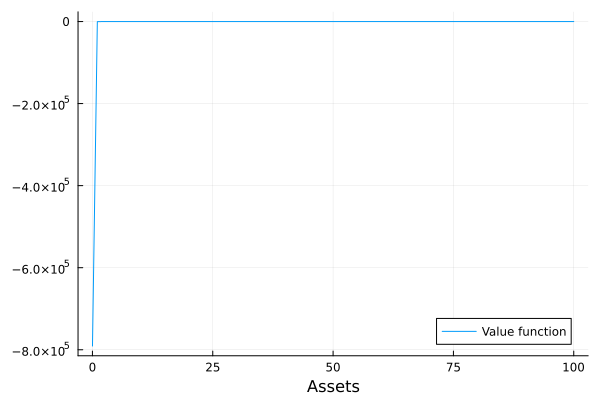

In [596]:
plot(dis.g, v, label="Value function", xlabel="Assets")

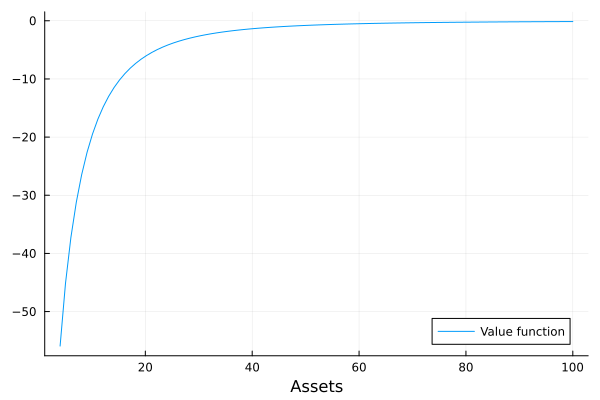

In [ ]:
# cropping first values to better see the shape, concave
plot(dis.g[5:end], v[5:end], label="Value function", xlabel="Assets")

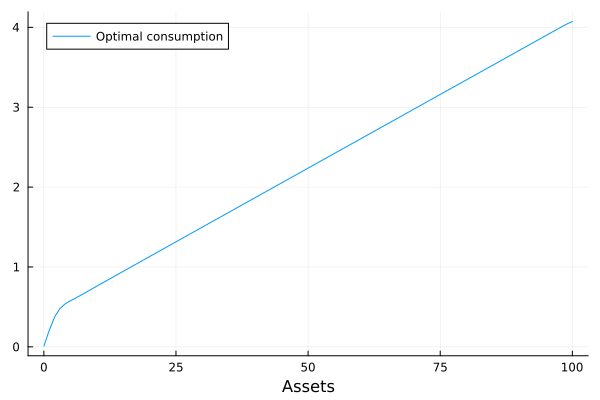

In [ ]:
# consuming almost all assets at low wealth, then due to concavity of utility, consumes less
# makes sense
plot(dis.g, pol, label="Optimal consumption", xlabel="Assets")

In [599]:
# Checking boundaries
(pol[1] > 0) && (pol <= dis.g) # (consumption is positive at low wealth) & (consumption never exceeds wealth)

true

In [ ]:
# Checking extrapolation: first at points below grid, then above grid
g_eps = range(eps/100, eps*100; length=N)
g_Abar = range(Abar-10, Abar+10; length=N)
ivals_l = [interp(dis.g, v, x) for x in g_eps]
ivals_u = [interp(dis.g, v, x) for x in g_Abar]

100-element Vector{Float64}:
 -0.17603138313770864
 -0.17499189127552695
 -0.17395239941334537
 -0.17291290755116362
 -0.171873415688982
 -0.17085394542994536
 -0.16985486043586664
 -0.16885577544178804
 -0.1678566904477094
 -0.1668576054536307
  ⋮
 -0.10199423714236573
 -0.10125657823106074
 -0.10051891931975579
 -0.09978126040845081
 -0.0990436014971458
 -0.09830594258584086
 -0.09756828367453588
 -0.09683062476323093
 -0.09609296585192592

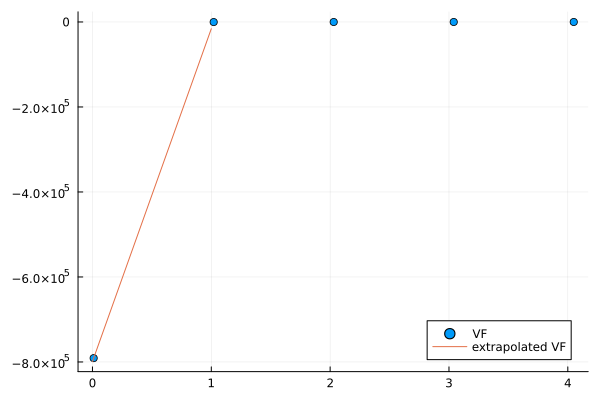

In [601]:
# lower extrapolation
scatter(dis.g[1:5], v[1:5], label="VF")
plot!(g_eps, ivals_l, label="extrapolated VF")

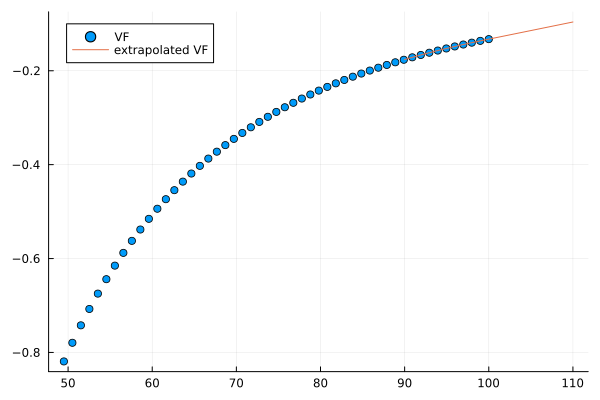

In [602]:
# upper extrapolation
scatter(dis.g[end-50:end], v[end-50:end], label="VF")
plot!(g_Abar, ivals_u, label="extrapolated VF")

#### Policy Function Iteration

**18.  Solve the consumption savings problem using policy function
    iteration (i.e. using howard improvement steps). Compare execution
    time with value function iteration.**

> **Note**
>
> You might need to define some intermediary functions, like
> `value_step` which updates the value at all grid points, for a given
> vector of policy choices and `policy_eval` which returns the value
> vector obtained by iterating `value_step` many times.

In [ ]:
function value_step(policy, vvec, m, p, dis)
    (; β, γ, σ) = m
    (; r, w) = p
    (; g, nodes, weights) = dis

    N = length(g)
    v_new = similar(vvec)

    for i in 1:N                # given policy vector, computes the new value function
        
        a = g[i]
        c = policy[i]
        Evvec = 0

        for j in 1:length(nodes)
            aprime = w * (1 + nodes[j] * σ) + r*(a-c)
            vprime = interp(g, vvec, aprime)
            Evvec += weights[j] * vprime
        end

        v_new[i] = u(c, m) + β * Evvec
    end

    return v_new
end


value_step (generic function with 1 method)

In [ ]:
function policy_eval(policy, vvec, m, p, dis; τ_η=1e-6, max_iter=1000, verbose=false)
    (; β, γ, α, Lbar, σ) = m
    (; r, w) = p
    (; g, nodes, weights) = dis

    for iter in 1:max_iter                  #  given initial value function, and policy, get the best value function
                                            #  out of this policy
        v_new = value_step(policy, vvec, m, p, dis) 

        η = maximum(abs.(v_new .- vvec))

        if verbose
            @show iter η
        end

        vvec = v_new

        if η < τ_η
            break
        end
    end

    return vvec
end


policy_eval (generic function with 1 method)

In [ ]:
function policy_iteration(m, p, dis; eps=1e-6, max_iter=100, τ_η=1e-6)
    
    (; β, γ, α, Lbar, σ) = m
    (; r, w) = p
    (; g, nodes, weights) = dis

    N = length(g)

    vvec = log.(g)                
    c_0 = collect(0.5 .* g)            

    v_new = vvec
    c_new = c_0
    
    for iter in 1:max_iter

        c_new = copy(c_0)

        for i in 1:N

            a = g[i]
            objective(c) = -value_update(a, c, vvec, m, p, dis)   #  improvement step
            result = optimize(objective, eps, a)
            c_new[i] = Optim.minimizer(result)

        end

        v_new = policy_eval(c_new, vvec, m, p, dis) # evaluates policy

        vvec = v_new
        
        η = maximum(abs.(c_new .- c_0))

        if η < τ_η
            break
        end
        
        c_0 = c_new
        
    end
    
    return v_new, c_new
end


policy_iteration (generic function with 1 method)

In [ ]:
v_pfi, pol_pfi = @time policy_iteration(m, p_0, dis)

# much faster than value function iteration 

  0.720360 seconds (10.23 M allocations: 1.892 GiB, 19.22% gc time)


([-791033.6785036628, -229.5539291601077, -101.14751285637197, -71.97654045496023, -55.92992932884383, -45.14875304960603, -37.263573103447584, -31.21501163304783, -26.44351304473249, -22.60943403570343  …  -0.17135081696680293, -0.1663558649001825, -0.16155320930901146, -0.15693368313682063, -0.15248863890555617, -0.14820991466885264, -0.14408980256044723, -0.14012102707614998, -0.13629671642824812, -0.1326087858140696], [0.009999999849508593, 0.20647114046236145, 0.3731484028406001, 0.4800113443952037, 0.5391095692234988, 0.5775241153889243, 0.6136241185245397, 0.6497241245585083, 0.6870556538460958, 0.7251919185749345  …  3.746385460167265, 3.7836211920547154, 3.8208566223704827, 3.8580916127538556, 3.8953261294015014, 3.932560543040173, 3.969794984143934, 4.006270818882027, 4.042370821140702, 4.072537549989753])

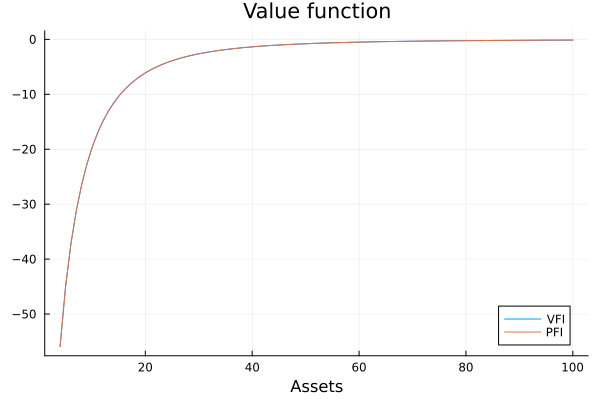

In [ ]:
plot(dis.g[5:end], v[5:end], label="VFI", xlabel="Assets")
plot!(dis.g[5:end], v_pfi[5:end], label="PFI")
title!("Value function")

# the solutions between VFI and PFI perfectly overlap

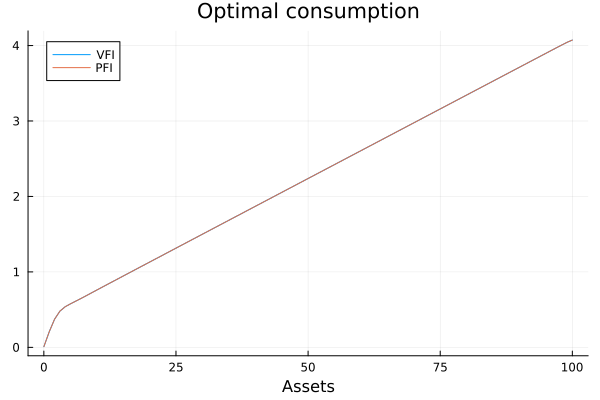

In [640]:
plot(dis.g, pol, label="VFI", xlabel="Assets")
plot!(dis.g, pol_pfi, label="PFI")
title!("Optimal consumption")


### Computing the Stable Distribution

Now that we have a consumption rule represented by a vector of
consumption values `cvec`, we would like to compute the corresponding
ergodic distribution in order to approximate capital supply $\int_i a_i$

#### With Monte Carlo

**19.  Write a function `transition(a, cvec, m, p)` which returns a new
    random asset level, from an initial `a`. The consumption choices are
    defined using `cvec` and can be interpolated as before.**

In [ ]:
function transition(a, cvec, m, p, dis)
    (; β, γ, α, Lbar, σ) = m
    (; r, w) = p
    (; g, nodes, weights) = dis

    # N(1,1) shock
    ϵ = 1 + σ * rand(dis.nodes) # take random draw of a node

    c = interp(g, cvec, a)

    # Asset law of motion
    a_next = w * ϵ + r * (a - c)
    return a_next
end


transition (generic function with 1 method)


**20.  Propose a way to draw $L=1000$ random points from the ergodic
    distribution. Plot the result.**


In [ ]:
function sim_ergo(a0, cvec, m, p, dis; T=10000, burnin=1000) # burn first draws, because distribution not yet
                                                            # stationary
    a_path = zeros(T)

    for t in 1:T
        a = transition(a0, cvec, m, p, dis)
        a_path[t] = a
        a0 = a
    end

    # Discard burn-in
    return a_path, a_path[burnin+1:end]
end


sim_ergo (generic function with 1 method)

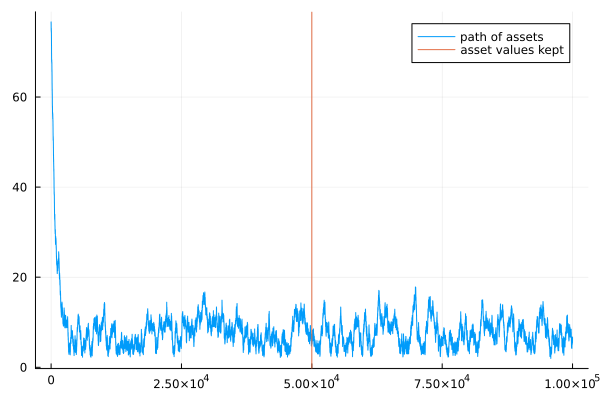

In [ ]:
a0 = rand(0:Abar)
h = 100000
burn = Int(round(h * 2 / 3)) # burn 2/3 of draws

a_next_simu, a_ergo = sim_ergo(a0, pol, m, p_0, dis; T=h, burnin=burn)
plot(a_next_simu, label="path of assets")
vline!([h/2], label="asset values kept")

# we keep only draws after the red line 

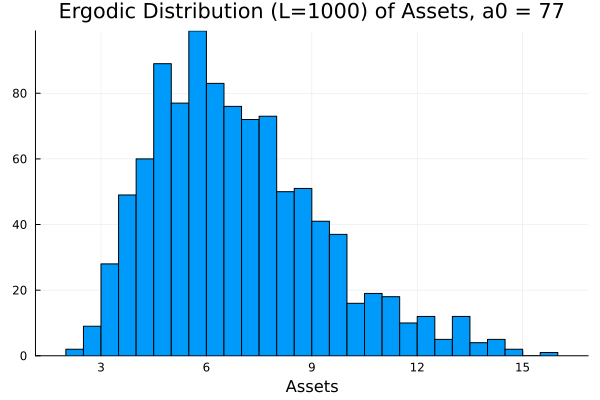

In [ ]:
L = 1000 # nb ofd points to draw from the draws we kept in the last step
ergo_dist = rand(a_ergo, L) # we only keep 1000 draws, from the ergodic distribution (after 2/3 of all draws)
histogram(ergo_dist, bins=50, title="Ergodic Distribution (L=1000) of Assets, a0 = $a0", xlabel="Assets", legend=false)


**21.  Compute the average of these values. It corresponds to the capital
    supply. What is the standard deviation of this method? (you can
    evaluate the standard deviation by performing the procedure again)**

In [ ]:
K_s_monte = mean(ergo_dist) # mean with monte carlo

6.906822383255843

In [644]:
loop_max = 100

Kstd_monte = zeros(loop_max)
for i in 1:loop_max
        
    a_next_sim, a_ergo = sim_ergo(a0, pol, m, p_0, dis; T=h, burnin=Int(h/2))
    ergo_dist = rand(a_ergo, L)
    Kstd_monte[i] = mean(ergo_dist)

end

println("Standard deviation with Monte Carlo:", std(Kstd_monte))

Standard deviation with Monte Carlo:0.3688014997755608


#### With a Markov Chain

**22.  Write a function
    `transition(a, c, m, p, dis)::Vector{Tuple{Float64, Float64}}` which
    returns a vector of asset levels with matching probabilities,
    obtained from initial level `a`, with consumption choice `c` for the
    various realizations of the discretized shocks (obtained from the
    quadrature).**

In [645]:
function transition(a, c, m, p, dis)

    (; β, γ, α, Lbar, σ) = m
    (; r, w) = p
    (; g, nodes, weights) = dis
    
    res = Vector{Tuple{Float64, Float64}}(undef, length(nodes))

    for i in 1:length(nodes)

        aprime = w * (1 + σ * nodes[i]) + r * (a - c) 

        res[i] = (aprime, weights[i])   

    end

    return res
end


transition (generic function with 1 method)

In [647]:
transition(a0, a0/2, m, p_0, dis)

5-element Vector{Tuple{Float64, Float64}}:
 (40.103413093502105, 0.011257411327720667)
 (40.2269346844571, 0.22207592200561244)
 (40.338467498400085, 0.5333333333333339)
 (40.45000031234308, 0.22207592200561244)
 (40.57352190329807, 0.011257411327720667)

**23.  Use the `transition` function to define a stochastic matrix `P` of
    size $N\times N$ such that $P_{ij}$ represents the probability of
    reaching grid point $j$ from grid point $i$. Use the trembling hand
    method to deal with asset levels that are out of the approximation
    grid.**

> **Tremblilng hand**
>
> When a given asset level $a$ reached with probability $w$ falls
> between two grid points $a_j$ and $a_{j+1}$, we consider that it
> reaches $a_j$ with probability $w\frac{a_{j+1}-a}{a_{j+1}-a_j}$ and
> $a_{j+1}$ with probability $w\frac{a-a_j}{a_{j+1}-a_j}$. This trick
> ensures that the stochastic matrix depends smoothly on the decision
> rule.

In [ ]:
function construct_P(cvec, m, p, dis)

    (; g, nodes, weights) = dis
    
    N = length(g)
    P = zeros(N, N) 

    for i in 1:N

        a = g[i]

        c = interp(g, cvec, a)

        transitions = transition(a, c, m, p, dis)

        for (a_next, weight) in transitions

           if a_next <= g[1] # if next period asset is below lowest point in grid

                P[i, 1] += weight

            elseif a_next >= g[end] # if next period asset is above highest lowest point in grid

                P[i, end] += weight

            else # if next period asset is between or at point in grid

                j = searchsortedfirst(g, a_next)
        
                j0 = j - 1

                w_u = (a_next - g[j0]) / (g[j] - g[j0])
                w_l = (g[j] - a_next) / (g[j] - g[j0])
                
                P[i, j0] += weight * w_l
                P[i, j]  += weight * w_u
            end
        end
    end

    return P
end


construct_P (generic function with 1 method)

In [651]:
P_0 = construct_P(pol, m, p_0, dis)

100×100 Matrix{Float64}:
 0.602604  0.397396    0.0        …  0.0         0.0         0.0
 0.0       0.767273    0.232727      0.0         0.0         0.0
 0.0       0.00412498  0.8931        0.0         0.0         0.0
 0.0       0.0         0.0210788     0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0        …  0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 ⋮                                ⋱                          
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.0       0.0         0.0           0.0         0.0         0.0
 0.

In [ ]:
# checking all rows sum to 1
for i in 1:size(P,1)
    if sum(P[1,:]) != 1.0
        print("pb")
    end
end

**24.  Compute the stable distribution $\mu$ of $P$. Compute the capital
    demand.**

In [653]:
using LinearAlgebra
import LinearAlgebra: I

In [654]:
function stable_dist(P)
    
    # using linear solver
    M = cat( P' - I,; dims=1)

    # replace last line with ones
    M[end,:] .= 1.0

    D = zeros(size(P,1))
    
    D[end] = 1.0
    μ = M \ D

end

stable_dist (generic function with 1 method)

In [655]:
μ_0 = stable_dist(P)

100-element Vector{Float64}:
  5.2394069985362e-16
  0.0002095744196685591
  0.011823981054617757
  0.05765098536042492
  0.10205876205849357
  0.10890954834595036
  0.1089095264876833
  0.10890952119871658
  0.10515367054773003
  0.095006477306151
  ⋮
 -9.779194480393734e-16
 -9.670440654006448e-16
 -9.564110236073835e-16
 -9.460133133618908e-16
 -9.358419386864804e-16
 -9.25887264269298e-16
 -9.210469209222534e-16
 -9.202459870840128e-16
 -9.60346563727197e-16

In [656]:
# Capital supply (with Markov Chains)
K_s_mc = dot(μ_0, dis.g)

# close to capital supply found with monte carlo (K_s_monte), but variance zero 

8.022364009013504

### Solve the Model

**25.  Using everything you have done so far write a function
    `capital_supply(K, m, p, dis)` which computes the rates
    corresponding to `K`, solves the consumption problem, computes the
    ergodic distribution and the corresponding capital supply.**

In [657]:
function capital_supply(K, m, dis)
    (; g) = dis

    # compute rates 
    prices = rates(K,m) 

    # solve the consumption problem
    v, pol = policy_iteration(m, prices, dis)

    # compute the ergodic distribution 
    P = construct_P(pol, m, prices, dis)
    muu = stable_dist(P)

    # compute capital supply
    K_s = dot(muu, g)

    return K_s
end

capital_supply (generic function with 2 methods)

In [658]:
capital_supply(K_0, m, dis)

8.02238612111284

**26.  Plot capital supply and capital demand (line $K=K$) for different
    levels of capital. Find the level of capital such that market for
    capital clears.**

In [671]:
K_grid = range(0.001, 2, length=100)

K_s = [capital_supply(K, m, dis) for K in K_grid]

100-element Vector{Float64}:
 100.0
 100.0
 100.0
 100.0
 100.0
 100.0
 100.0
 100.0
 100.0
   2.8690892710734195
   ⋮
   1.025475918324292
   1.0270908342574834
   1.028707299731992
   1.0303249735143032
   1.0319435379431294
   1.0335626940564455
   1.0351821625582736
   1.0368016779472815
   1.038420994705896

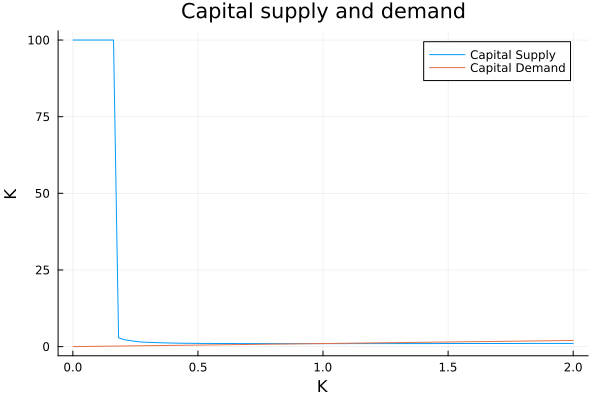

In [ ]:
# plotting supply and demand of capital 

plot(K_grid, K_s, label="Capital Supply")
plot!(K_grid, K_grid, label="Capital Demand")
xlabel!("K")
ylabel!("K")
title!("Capital supply and demand")

In [ ]:
using Roots 

In [ ]:
# root finding procedure to find the market clearing capital level

f(K) = capital_supply(K, m, dis) - K
K_star = find_zero(f, K_0)
println("Market-clearing K: $K_star")

Market-clearing K: 0.9764532168869419


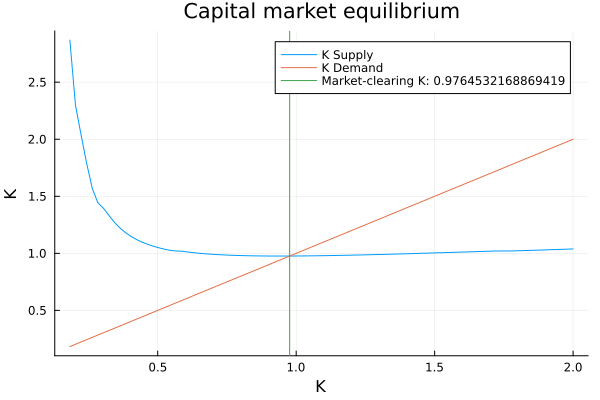

In [681]:
plot(K_grid[10:end], K_s[10:end], label="K Supply")
plot!(K_grid[10:end], K_grid[10:end], label="K Demand")
vline!([K_star], label = "Market-clearing K: $K_star")
xlabel!("K")
ylabel!("K")
title!("Capital market equilibrium")

In [680]:
# equilibrium market rates
rates(K_star, m)

(r = 0.3050459380450771, w = 0.6950138708389574)